# 02 — Model Comparison (Visual)

Qualitative side-by-side comparison of YOLO and MediaPipe pose estimation on representative push-up frames.

In [19]:
import sys
sys.path.insert(0, "..")

import time
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from src.pose_estimation import YoloEstimator, MediaPipeEstimator
from src.pose_estimation.visualization import draw_comparison
from src.pose_estimation.keypoint_schema import UNIFIED_JOINTS

plt.rcParams["figure.dpi"] = 120
plt.rcParams["figure.figsize"] = (12, 6)

DATA_DIR = Path("../data/raw/kaggle_pushups")

## 1. Instantiate Models

In [20]:
models = [
    YoloEstimator(),
    MediaPipeEstimator(),
]
model_names = [m.model_name for m in models]
print("Models loaded:", model_names)

Models loaded: ['YOLO (yolo11s-pose.pt)', 'MediaPipe Pose (full)']


I0000 00:00:1770367565.911709 6315192 gl_context.cc:407] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M2
W0000 00:00:1770367565.990100 6315200 inference_feedback_manager.cc:121] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770367566.016678 6315200 inference_feedback_manager.cc:121] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


## 2. Select Representative Frames

Pick frames that cover different push-up phases and form quality:
- Top position (arms extended)
- Bottom position (chest near floor)
- Correct form
- Incorrect form

In [21]:
# Select videos for comparison
correct_videos = sorted((DATA_DIR / "Correct sequence").glob("*.mp4"))
wrong_videos = sorted((DATA_DIR / "Wrong sequence").glob("*.mp4"))

# Pick 3 correct + 3 incorrect, extract frames at different positions
frame_specs = [
    (correct_videos[0], 0.15, "Correct — top position"),
    (correct_videos[0], 0.50, "Correct — mid/bottom"),
    (correct_videos[1], 0.40, "Correct — different subject"),
    (wrong_videos[0], 0.25, "Incorrect — early"),
    (wrong_videos[0], 0.60, "Incorrect — mid"),
    (wrong_videos[2], 0.50, "Incorrect — different subject"),
]

frames = []
titles = []
for vpath, pct, title in frame_specs:
    cap = cv2.VideoCapture(str(vpath))
    n = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(n * pct))
    ret, frame = cap.read()
    cap.release()
    if ret:
        frames.append(frame)
        titles.append(title)

print(f"Selected {len(frames)} frames for comparison")

Selected 6 frames for comparison


## 3. Side-by-Side Skeleton Overlays

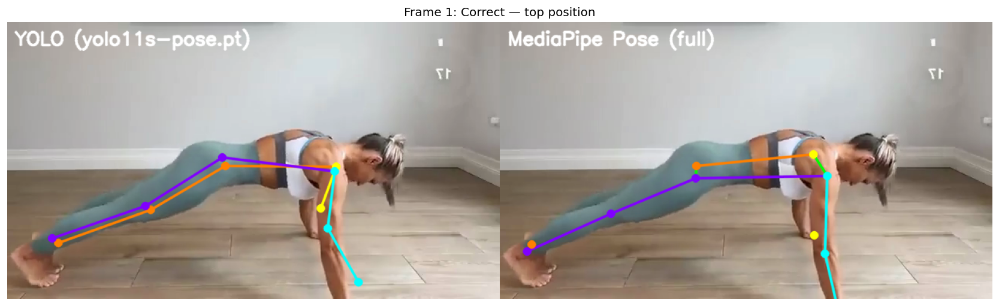

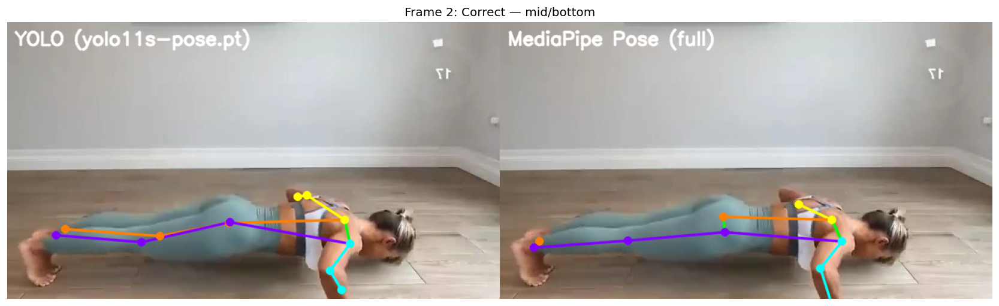

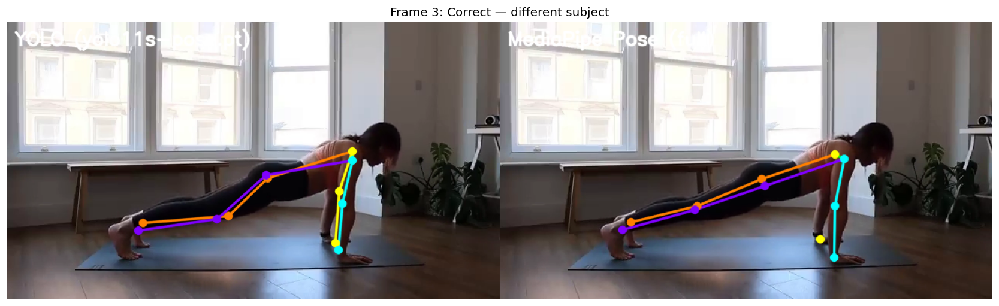

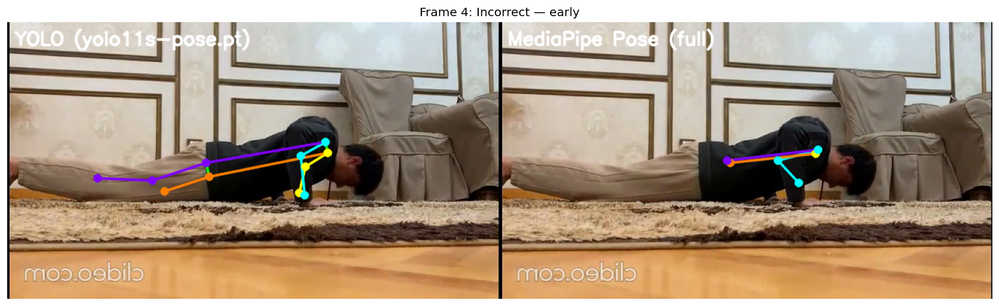

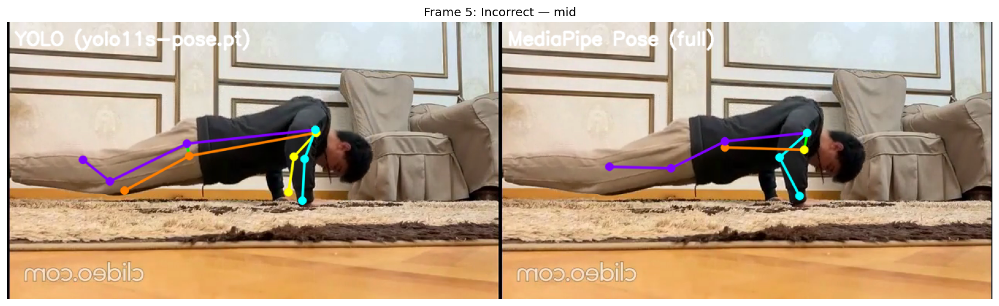

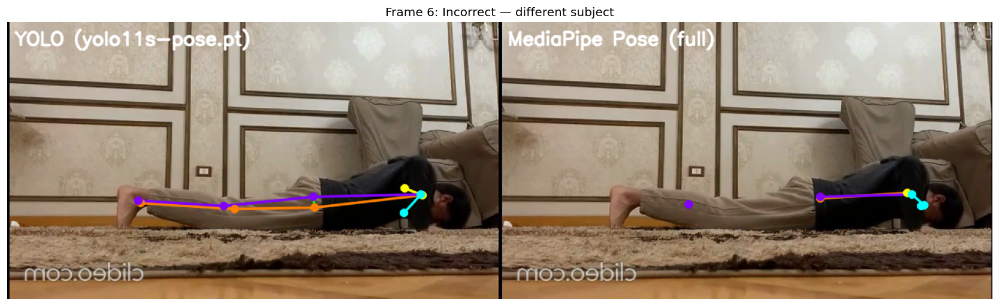

In [22]:
for idx, (frame, title) in enumerate(zip(frames, titles)):
    # Run all models on this frame
    results = [m.predict_frame(frame) for m in models]
    
    # Draw comparison
    comparison = draw_comparison(frame, results)
    comparison_rgb = cv2.cvtColor(comparison, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.imshow(comparison_rgb)
    ax.set_title(f"Frame {idx+1}: {title}", fontsize=12)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

## 4. Per-Joint Confidence Table & Heatmap

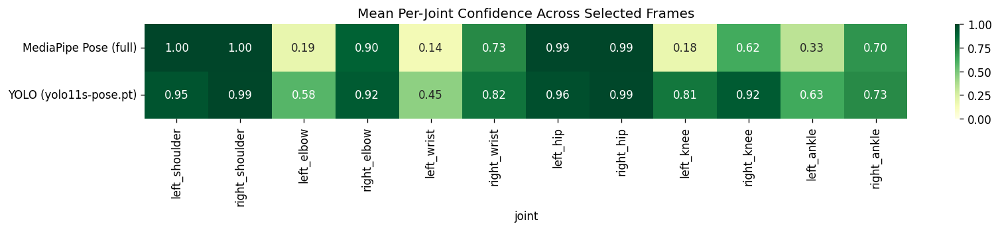

In [23]:
# Collect per-joint confidence for all models on all selected frames
conf_data = []
for frame_idx, frame in enumerate(frames):
    for model in models:
        result = model.predict_frame(frame)
        for j, joint in enumerate(UNIFIED_JOINTS):
            conf_data.append({
                "frame": titles[frame_idx],
                "model": model.model_name,
                "joint": joint,
                "confidence": result.unified_keypoints[j, 2],
            })

conf_df = pd.DataFrame(conf_data)

# Average confidence per model x joint across all frames
pivot = conf_df.groupby(["model", "joint"])["confidence"].mean().unstack("joint")
pivot = pivot[UNIFIED_JOINTS]  # keep original order

fig, ax = plt.subplots(figsize=(14, 3))
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlGn", vmin=0, vmax=1, ax=ax)
ax.set_title("Mean Per-Joint Confidence Across Selected Frames")
ax.set_ylabel("")
plt.tight_layout()
plt.show()

## 5. Inference Timing Comparison

                 model   mean_ms    std_ms  median_ms
YOLO (yolo11s-pose.pt) 34.501573 11.517366  32.408021
 MediaPipe Pose (full) 26.076852  7.517216  24.278292


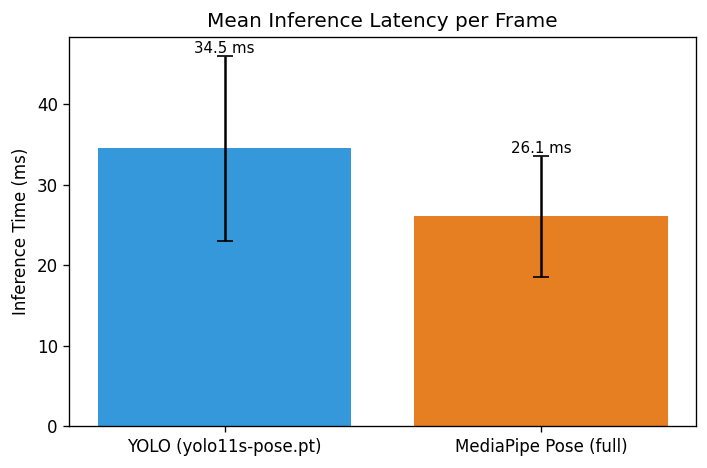

In [24]:
# Time each model on 20 frames (after 5 warmup)
test_frame = frames[0]
timing = {m.model_name: [] for m in models}

for model in models:
    # Warmup
    for _ in range(5):
        model.predict_frame(test_frame)
    # Timed
    for _ in range(20):
        t0 = time.perf_counter()
        model.predict_frame(test_frame)
        timing[model.model_name].append((time.perf_counter() - t0) * 1000)

timing_df = pd.DataFrame([
    {"model": name, "mean_ms": np.mean(t), "std_ms": np.std(t), "median_ms": np.median(t)}
    for name, t in timing.items()
])
print(timing_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(6, 4))
colors = ["#3498db", "#e67e22"]
bars = ax.bar(timing_df["model"], timing_df["mean_ms"], yerr=timing_df["std_ms"],
              color=colors[:len(models)], capsize=5)
ax.bar_label(bars, fmt="%.1f ms", fontsize=9)
ax.set_ylabel("Inference Time (ms)")
ax.set_title("Mean Inference Latency per Frame")
plt.tight_layout()
plt.show()

## 6. Observations (Clean Data)

**Visual comparison findings:**

- Both models successfully detect the person in all tested frames.
- YOLO tends to have higher joint confidence scores overall.
- MediaPipe provides smoother skeleton output but may be less confident on occluded joints.
- For push-up analysis, the key joints (shoulders, elbows, wrists, hips) are well-detected by both models.
- Inference speed differs significantly — see the benchmark analysis notebook for full quantitative comparison.

## 7. Stress Test — Challenging Conditions

Test both models on videos that push beyond the clean Kaggle dataset:
different camera angles, low resolution, compression artifacts, multiple people.

**Folder structure:**
```
data/raw/stress_test/
├── side_angle/          # Camera at 90° to the subject (profile view)
├── front_angle/         # Camera facing the subject head-on
├── diagonal/            # Camera at ~45° angle
├── low_resolution/      # 240p–360p quality
├── poor_lighting/       # Dark gym, backlit, shadows (optional)
├── noisy_compressed/    # Heavy JPEG/codec artifacts (optional)
└── multiple_people/     # More than one person in frame
```

Empty folders are skipped automatically.

In [25]:
STRESS_DIR = Path("../data/raw/stress_test")
CHALLENGE_TYPES = [
    "side_angle", "front_angle", "diagonal", "low_resolution",
    "poor_lighting", "noisy_compressed", "multiple_people",
]

# Discover available stress test videos
stress_videos = {}
total = 0
for challenge in CHALLENGE_TYPES:
    folder = STRESS_DIR / challenge
    if not folder.exists():
        continue
    vids = sorted(folder.glob("*.mp4")) + sorted(folder.glob("*.avi")) + sorted(folder.glob("*.mov"))
    if vids:
        stress_videos[challenge] = vids
        total += len(vids)
    else:
        print(f"  [{challenge}] — empty, skipping")

print(f"\nFound {total} stress test videos across {len(stress_videos)} categories")
if total == 0:
    print("\n⚠ No stress test videos found. Add clips to data/raw/stress_test/ subfolders and re-run.")

  [poor_lighting] — empty, skipping
  [noisy_compressed] — empty, skipping

Found 11 stress test videos across 5 categories


### 7a. Skeleton Overlays on Stress Test Frames

For each challenge category, extract 3 frames (25%, 50%, 75%) from the first video and show side-by-side model outputs.

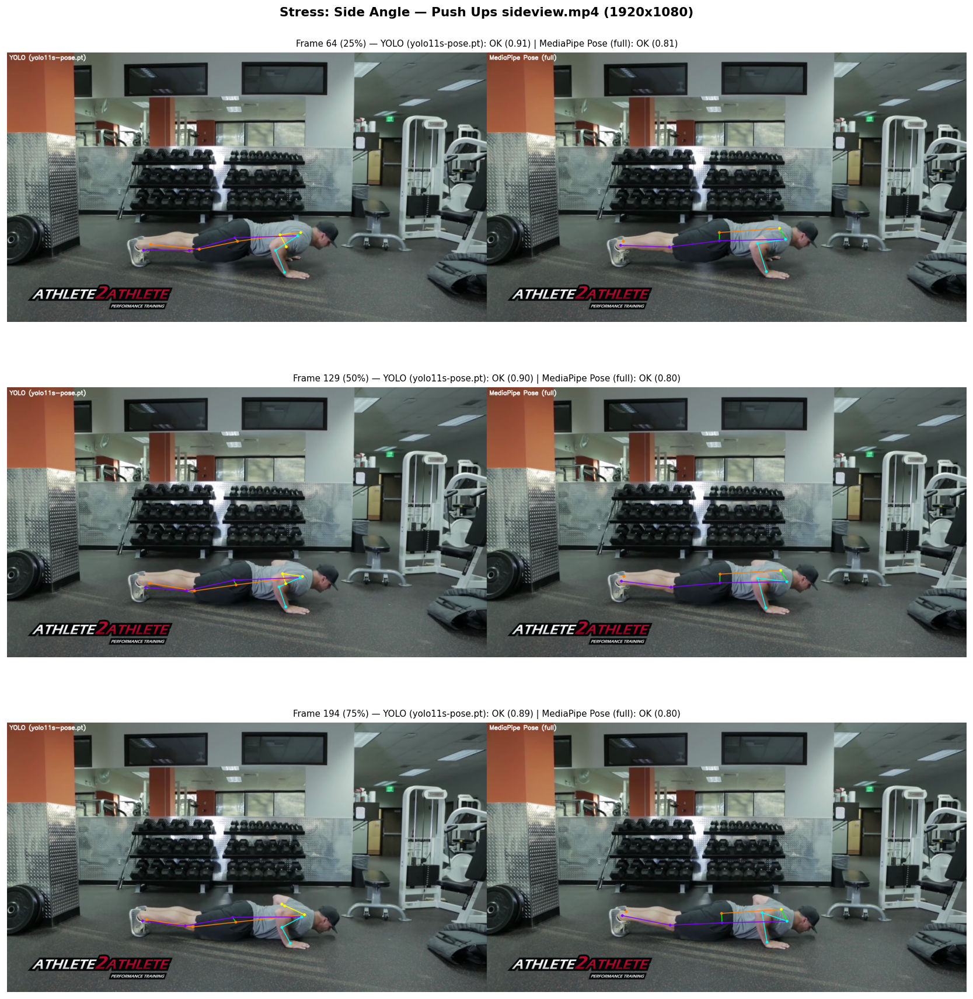

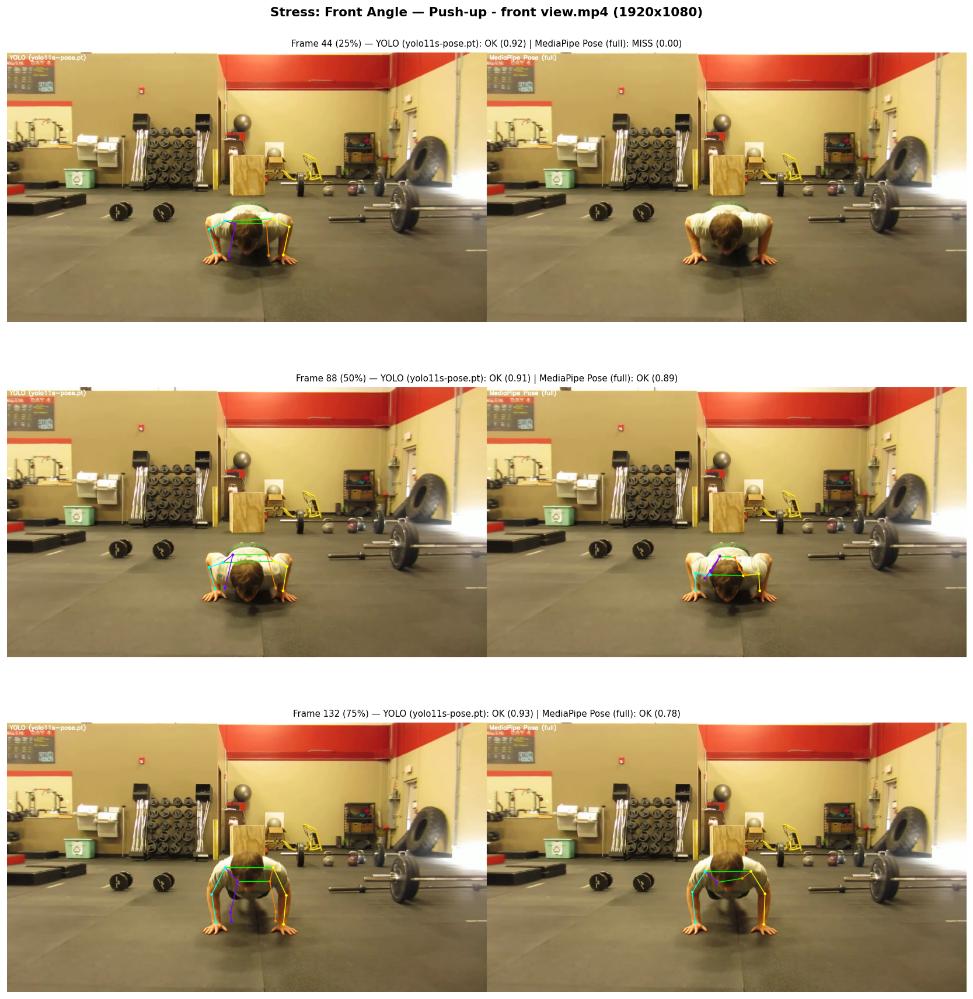

/var/folders/1q/pcrqby796fnbjgbr9ty_p12m0000gn/T/ipykernel_9622/1412122432.py:42: UserWarning: Glyph 65372 (\N{FULLWIDTH VERTICAL LINE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/ikhyvicky/CS604/pushup-tracker/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 65372 (\N{FULLWIDTH VERTICAL LINE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


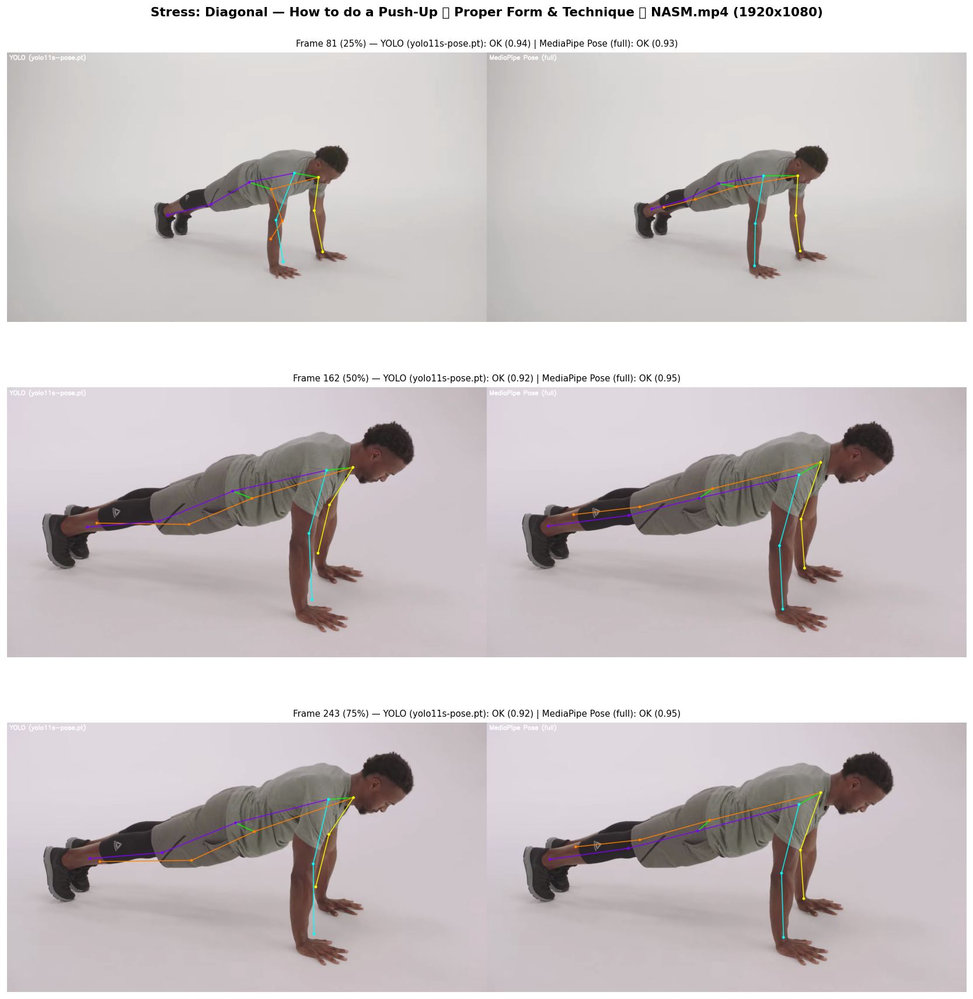

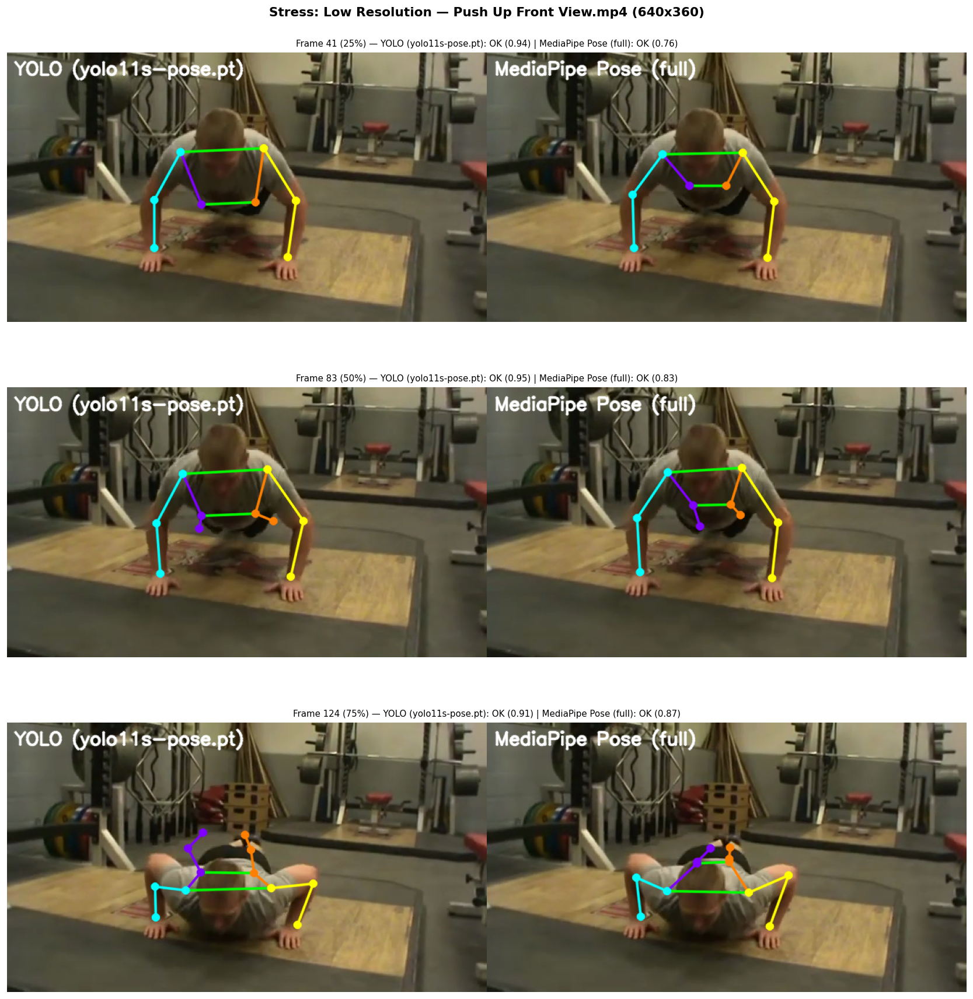

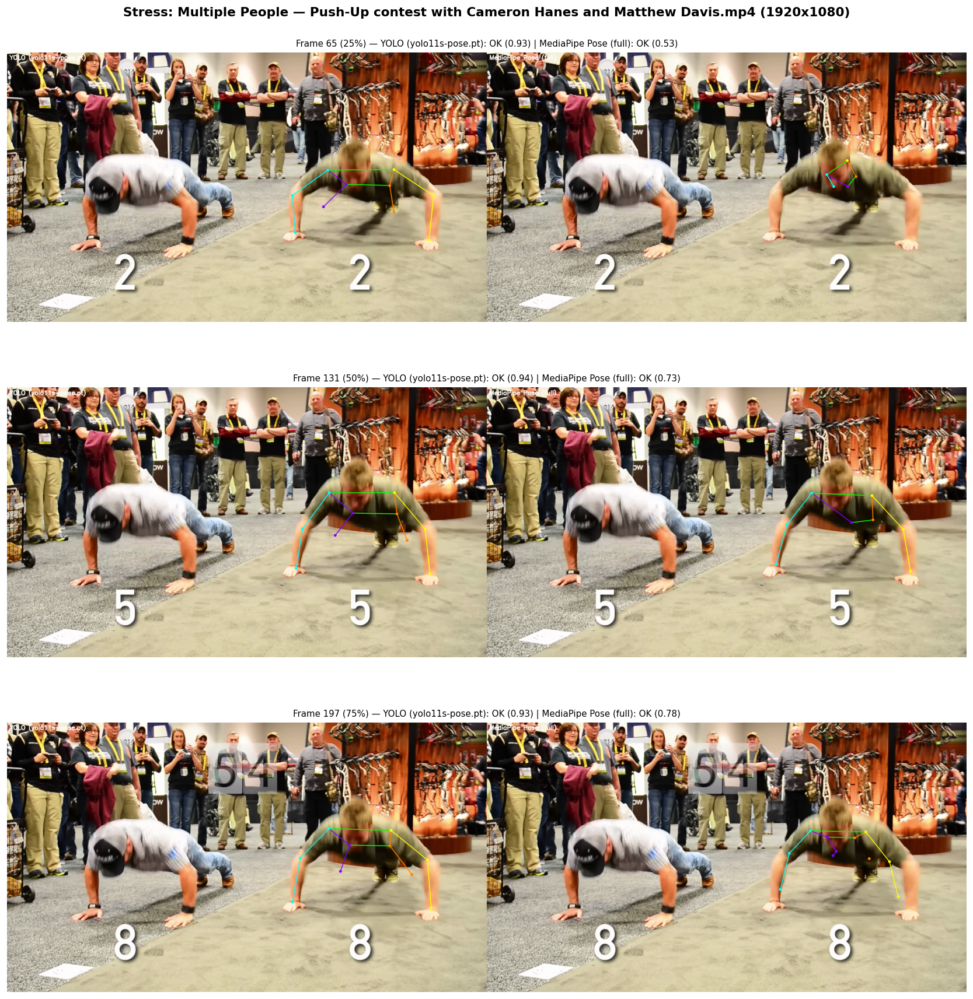

In [26]:
if stress_videos:
    positions = [0.25, 0.50, 0.75]

    for challenge, vids in stress_videos.items():
        vpath = vids[0]  # use first video per category
        cap = cv2.VideoCapture(str(vpath))
        n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

        fig, axes = plt.subplots(len(positions), 1, figsize=(14, 5 * len(positions)))
        if len(positions) == 1:
            axes = [axes]

        fig.suptitle(
            f"Stress: {challenge.replace('_', ' ').title()} — {vpath.name} ({w}x{h})",
            fontsize=13, fontweight="bold",
        )

        for i, pct in enumerate(positions):
            target = int(n_frames * pct)
            cap.set(cv2.CAP_PROP_POS_FRAMES, target)
            ret, frame = cap.read()
            if not ret:
                axes[i].set_title(f"Frame {target} — read failed")
                axes[i].axis("off")
                continue

            results = [m.predict_frame(frame) for m in models]
            comparison = draw_comparison(frame, results)
            comparison_rgb = cv2.cvtColor(comparison, cv2.COLOR_BGR2RGB)

            det_str = " | ".join(
                f"{r.model_name}: {'OK' if r.detected else 'MISS'} ({r.detection_confidence:.2f})"
                for r in results
            )
            axes[i].imshow(comparison_rgb)
            axes[i].set_title(f"Frame {target} ({int(pct*100)}%) — {det_str}", fontsize=9)
            axes[i].axis("off")

        cap.release()
        plt.tight_layout()
        plt.show()

### 7b. Stress Test Scorecard

Run both models on every frame of every stress test video. Compare detection rate and mean confidence per challenge category.

In [15]:
if stress_videos:
    scorecard_rows = []

    for challenge, vids in stress_videos.items():
        for vpath in vids:
            cap = cv2.VideoCapture(str(vpath))
            n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
            # Sample up to 30 evenly-spaced frames per video (keeps it fast)
            sample_indices = np.linspace(0, n_frames - 1, min(30, n_frames), dtype=int)

            for model in models:
                detections = 0
                confs = []
                joint_confs = {j: [] for j in UNIFIED_JOINTS}

                for idx in sample_indices:
                    cap.set(cv2.CAP_PROP_POS_FRAMES, int(idx))
                    ret, frame = cap.read()
                    if not ret:
                        continue
                    result = model.predict_frame(frame)
                    detections += int(result.detected)
                    confs.append(result.detection_confidence)
                    for j_idx, j_name in enumerate(UNIFIED_JOINTS):
                        joint_confs[j_name].append(result.unified_keypoints[j_idx, 2])

                n_sampled = len(confs)
                row = {
                    "challenge": challenge,
                    "video": vpath.name,
                    "model": model.model_name,
                    "n_sampled": n_sampled,
                    "detection_rate": detections / n_sampled if n_sampled else 0,
                    "mean_confidence": np.mean(confs) if confs else 0,
                }
                # Mean per-joint confidence
                for j_name in UNIFIED_JOINTS:
                    row[f"conf_{j_name}"] = np.mean(joint_confs[j_name]) if joint_confs[j_name] else 0
                scorecard_rows.append(row)

            cap.release()

    stress_df = pd.DataFrame(scorecard_rows)

    # Summary per challenge x model
    summary = stress_df.groupby(["challenge", "model"]).agg(
        detection_rate=("detection_rate", "mean"),
        mean_confidence=("mean_confidence", "mean"),
    ).round(3).unstack("model")

    print("=== Stress Test Scorecard ===\n")
    display(summary)

=== Stress Test Scorecard ===



detection_rate                         \
model           MediaPipe Pose (full) YOLO (yolo11s-pose.pt)   
challenge                                                      
diagonal                        1.000                  1.000   
front_angle                     0.950                  1.000   
low_resolution                  0.933                  1.000   
multiple_people                 0.617                  0.867   
side_angle                      1.000                  1.000   

                      mean_confidence                         
model           MediaPipe Pose (full) YOLO (yolo11s-pose.pt)  
challenge                                                     
diagonal                        0.877                  0.903  
front_angle                     0.759                  0.928  
low_resolution                  0.778                  0.921  
multiple_people                 0.475                  0.773  
side_angle                      0.832                  0.907

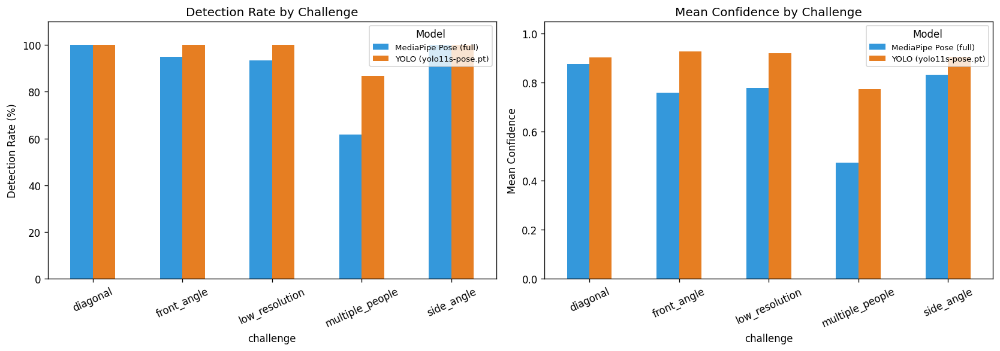

In [17]:
if stress_videos:
    # Grouped bar chart: detection rate by challenge x model
    plot_df = stress_df.groupby(["challenge", "model"])["detection_rate"].mean().unstack("model") * 100

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    plot_df.plot(kind="bar", ax=axes[0], rot=25, color=["#3498db", "#e67e22"])
    axes[0].set_ylabel("Detection Rate (%)")
    axes[0].set_title("Detection Rate by Challenge")
    axes[0].set_ylim(0, 110)
    axes[0].legend(title="Model", fontsize=8)

    # Confidence by challenge x model
    conf_plot = stress_df.groupby(["challenge", "model"])["mean_confidence"].mean().unstack("model")
    conf_plot.plot(kind="bar", ax=axes[1], rot=25, color=["#3498db", "#e67e22"])
    axes[1].set_ylabel("Mean Confidence")
    axes[1].set_title("Mean Confidence by Challenge")
    axes[1].set_ylim(0, 1.05)
    axes[1].legend(title="Model", fontsize=8)

    plt.tight_layout()
    plt.show()

### 7c. Per-Joint Confidence Heatmap (Stress Test)

Which joints break first under each challenge condition?

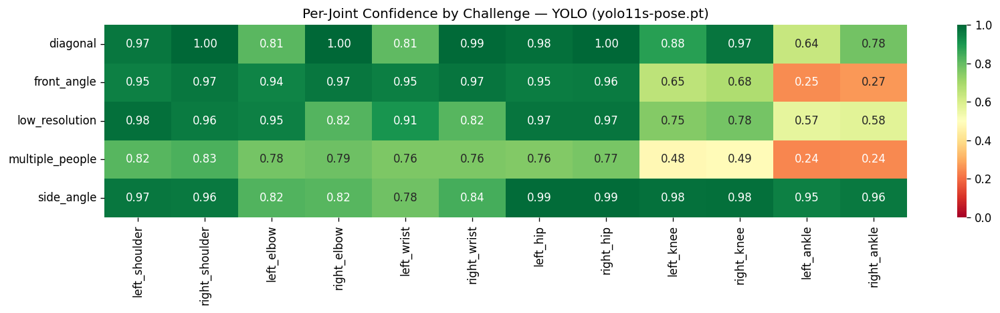

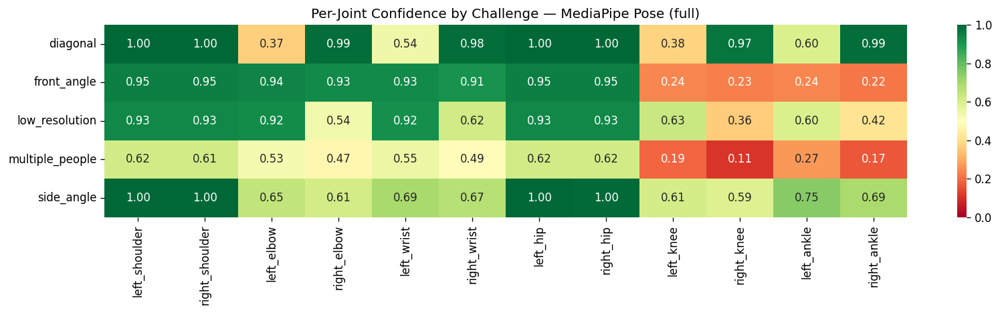

In [16]:
if stress_videos:
    conf_cols = [f"conf_{j}" for j in UNIFIED_JOINTS]

    for model_name in stress_df["model"].unique():
        subset = stress_df[stress_df["model"] == model_name]
        pivot = subset.groupby("challenge")[conf_cols].mean()
        pivot.columns = UNIFIED_JOINTS

        fig, ax = plt.subplots(figsize=(14, max(3, len(pivot) * 0.8)))
        sns.heatmap(pivot, annot=True, fmt=".2f", cmap="RdYlGn", vmin=0, vmax=1, ax=ax)
        ax.set_title(f"Per-Joint Confidence by Challenge — {model_name}")
        ax.set_ylabel("")
        plt.tight_layout()
        plt.show()

### 7d. Stress Test vs Clean Data Comparison

Compare each model's performance on the clean Kaggle dataset against the stress test results.

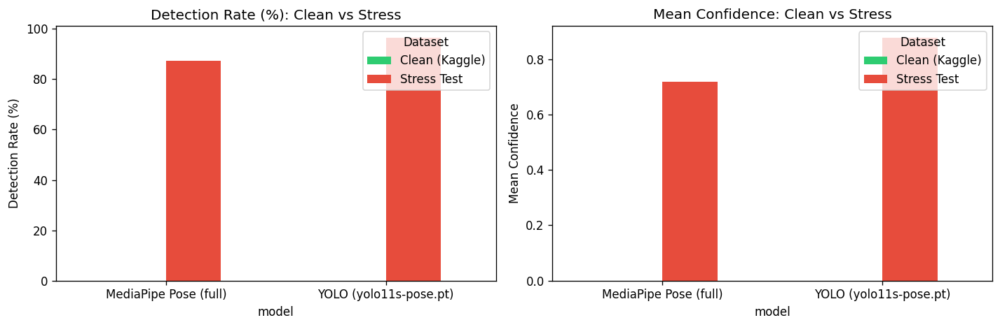

\nDegradation summary:
  YOLO (yolo11s-pose.pt): nan% -> 96.4% (drop: +nanpp)
  MediaPipe Pose (full): nan% -> 87.4% (drop: +nanpp)


In [18]:
if stress_videos:
    # Load clean benchmark for comparison
    clean_bench = pd.read_csv("../data/processed/benchmark/full_benchmark.csv")

    comparison_rows = []
    for model_name in stress_df["model"].unique():
        clean_sub = clean_bench[clean_bench["model"] == model_name]
        stress_sub = stress_df[stress_df["model"] == model_name]
        comparison_rows.append({
            "model": model_name,
            "dataset": "Clean (Kaggle)",
            "detection_rate": clean_sub["detected"].mean() * 100,
            "mean_confidence": clean_sub["detection_confidence"].mean(),
        })
        comparison_rows.append({
            "model": model_name,
            "dataset": "Stress Test",
            "detection_rate": stress_sub["detection_rate"].mean() * 100,
            "mean_confidence": stress_sub["mean_confidence"].mean(),
        })

    comp_df = pd.DataFrame(comparison_rows)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for i, metric in enumerate(["detection_rate", "mean_confidence"]):
        pivot = comp_df.pivot(index="model", columns="dataset", values=metric)
        pivot.plot(kind="bar", ax=axes[i], rot=0, color=["#2ecc71", "#e74c3c"])
        ylabel = "Detection Rate (%)" if metric == "detection_rate" else "Mean Confidence"
        axes[i].set_ylabel(ylabel)
        axes[i].set_title(f"{ylabel}: Clean vs Stress")
        axes[i].legend(title="Dataset")

    plt.tight_layout()
    plt.show()

    print("\\nDegradation summary:")
    for model_name in stress_df["model"].unique():
        clean_det = clean_bench[clean_bench["model"] == model_name]["detected"].mean() * 100
        stress_det = stress_df[stress_df["model"] == model_name]["detection_rate"].mean() * 100
        drop = clean_det - stress_det
        print(f"  {model_name}: {clean_det:.1f}% -> {stress_det:.1f}% (drop: {drop:+.1f}pp)")

## 8. Conclusions

**Clean data findings** (Sections 1-6):
- Both models perform well on the standardized Kaggle dataset
- See Section 6 for detailed observations

**Stress test findings** (Section 7):
- Fill in after running with stress test videos
- Key questions to answer:
  1. Which model degrades more gracefully?
  2. Which challenge type causes the largest drop in detection rate?
  3. Which joints are most affected under each condition?
  4. Is the degradation severe enough to require preprocessing (e.g. resolution upscaling, denoising) for deployment?